/home/liusong/.local/lib/python3.7/site-packages/ipykernel_launcher.py:18: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
/usr/local/python3/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


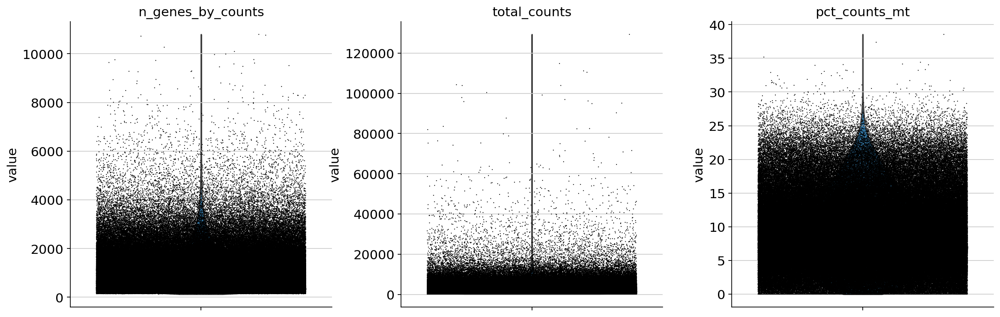

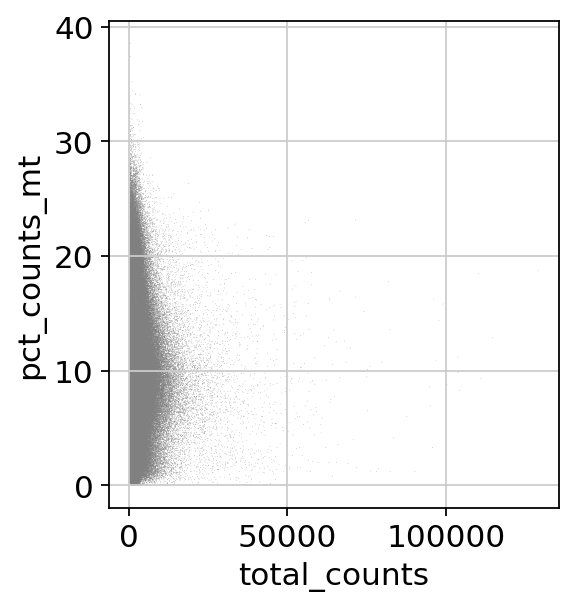

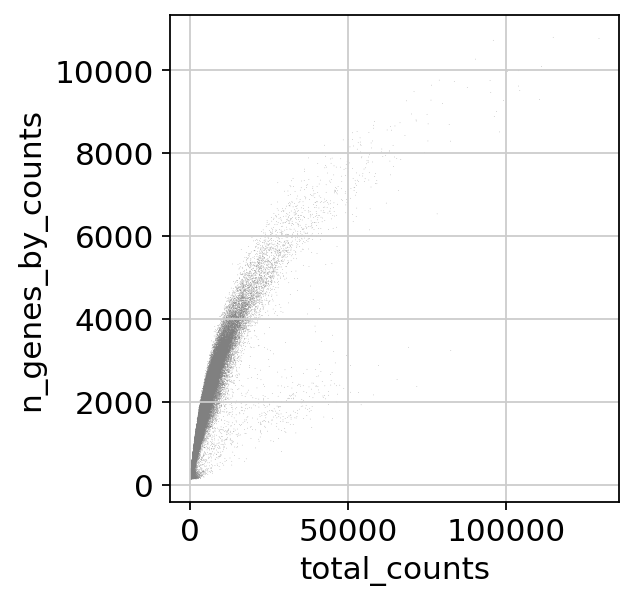

/home/liusong/.local/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


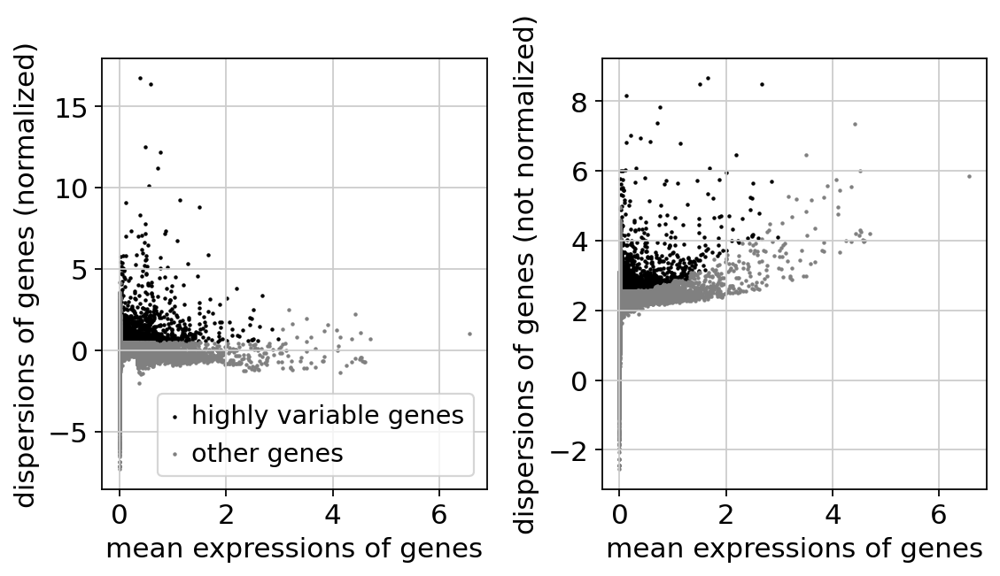

/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


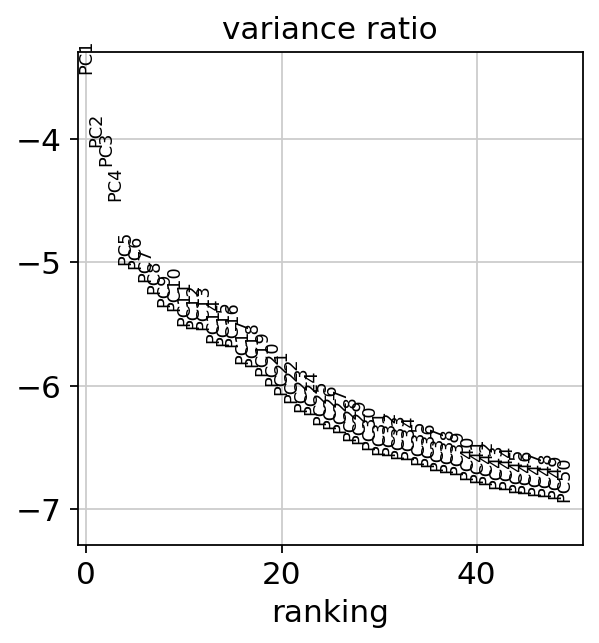

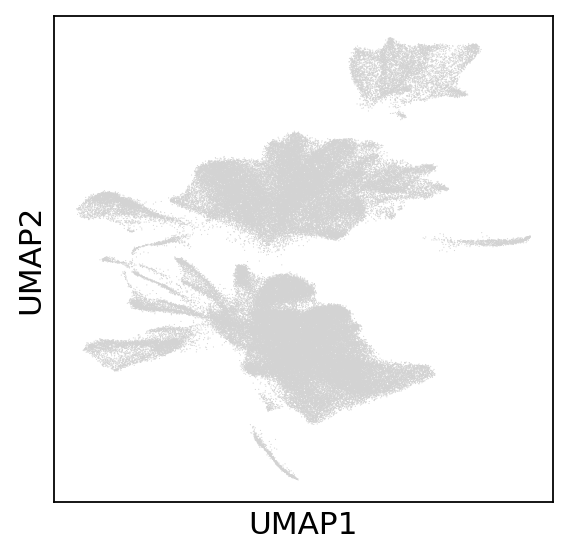

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt
import scanpy.external as sce
import bbknn
sc.set_figure_params(dpi_save=300)

NGdata=sc.read_h5ad("NG_alldata2024.h5ad")
#NGdata.__dict__['_raw'].__dict__["_var"]=NGdata.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})
#del(NGdata.var['_index'])
#NGdata.var_names=NGdata.var['features']
ribosomes=NGdata.var_names.str.match("^RP[LS]")
NGdata=NGdata[:,~ribosomes] 

NGdata.var['mt']=NGdata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(NGdata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(NGdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],jitter=0.4, multi_panel=True)
sc.pl.scatter(NGdata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(NGdata, x='total_counts', y='n_genes_by_counts')
sc.pp.normalize_total(NGdata, target_sum=1e4)
sc.pp.log1p(NGdata)
NGdata.obs['sampleID']=NGdata.obs_names.str.lstrip('ATCG-')

NGPEM=NGdata[NGdata.obs["Major.Class"]=="Endometriosis",]
NGPEM.uns['log1p']["base"] = None
sc.pp.highly_variable_genes(NGPEM, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(NGPEM)
NGPEM.raw = NGPEM

NGPEM = NGPEM[:, NGPEM.var.highly_variable]
sc.pp.regress_out(NGPEM, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(NGPEM, max_value=10)
sc.tl.pca(NGPEM, svd_solver='arpack')
sc.pl.pca_variance_ratio(NGPEM, log=True,n_pcs=50)

bbknn.bbknn(NGPEM,batch_key='sampleID')
sc.tl.umap(NGPEM)
sc.pl.umap(NGPEM)
sc.tl.leiden(NGPEM)

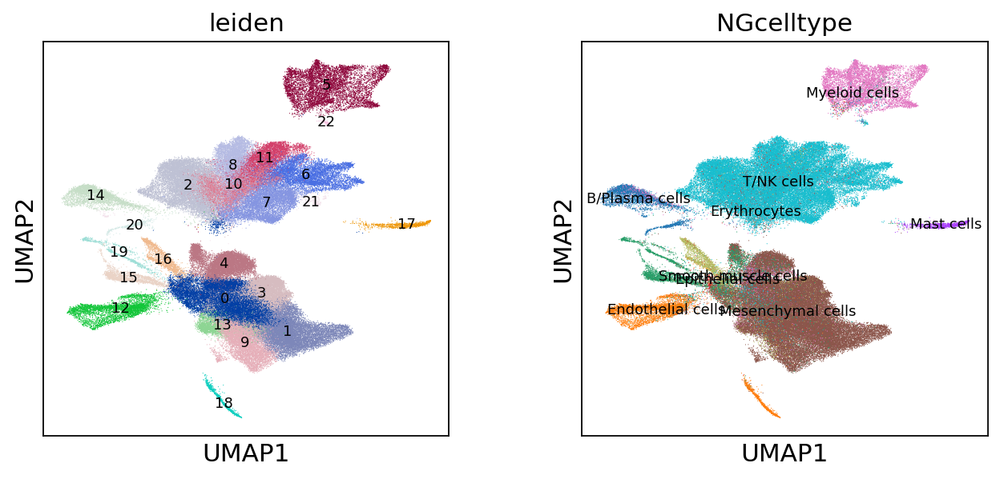

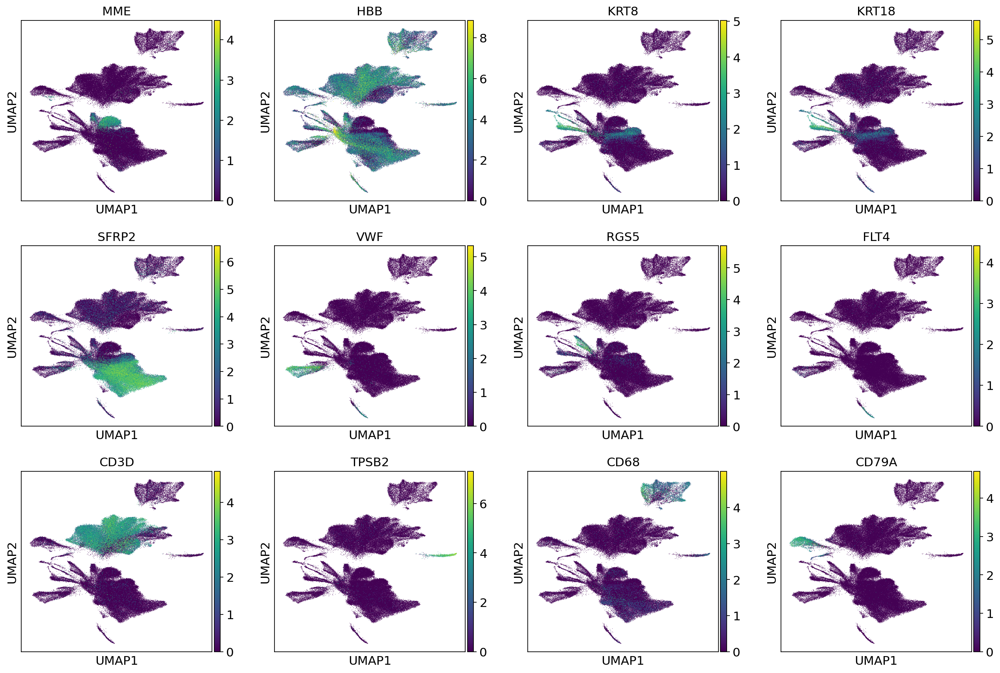

/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


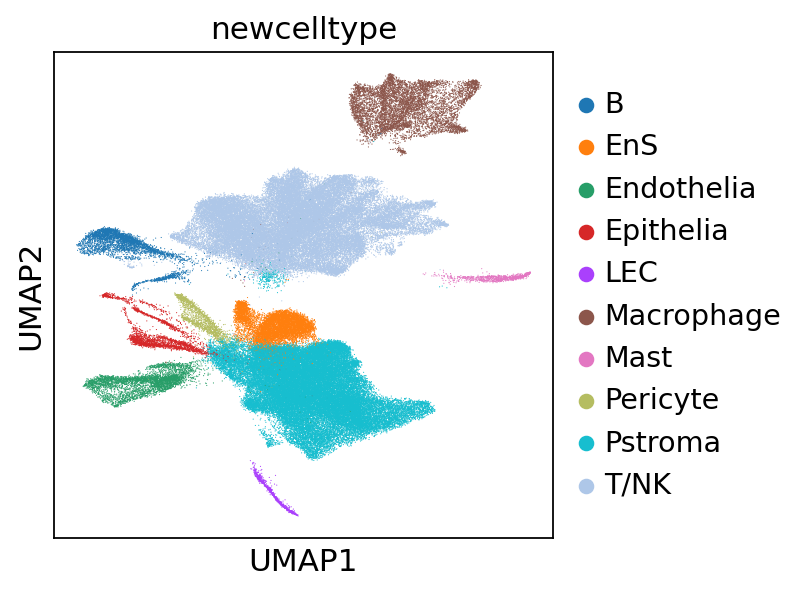

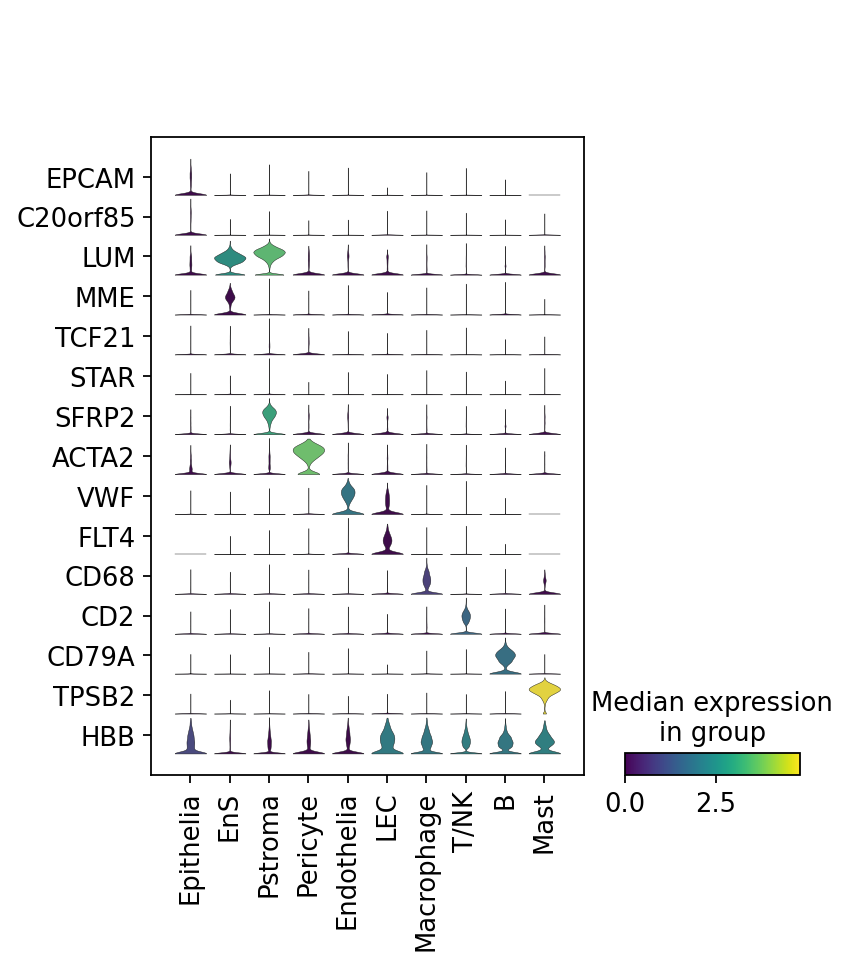

In [6]:
sc.pl.umap(NGPEM,color=['leiden',"NGcelltype"],legend_loc="on data",legend_fontsize='xx-small',legend_fontweight='medium')
sc.pl.umap(NGPEM,color=['MME','HBB','KRT8','KRT18','SFRP2','VWF','RGS5','FLT4','CD3D','TPSB2','CD68','CD79A'])
PEMnew_cluster_names=['Pstroma0', 'Pstroma1','T/NK2','Pstroma3','EnS4','Macrophage5','T/NK6','T/NK7','T/NK8','Pstroma9','T/NK10','T/NK11','Endothelia12','Pstroma13','B14','Epithelia15','Pericyte16','Mast17','LEC18','Epithelia19','B20','T/NK21','Macrophage22']
NGPEM.obs['myname']=NGPEM.obs['leiden']
NGPEM.rename_categories('myname', PEMnew_cluster_names)
NGPEM.obs['newcelltype']=NGPEM.obs.myname.str.strip('0123456789')
sc.pl.umap(NGPEM, color=['newcelltype'],save="NGPEM_newcelltype.pdf")
sc.pl.stacked_violin(NGPEM,['EPCAM','C20orf85','LUM','MME','TCF21','STAR','SFRP2','ACTA2','VWF','FLT4','CD68','CD2','CD79A','TPSB2','HBB'],groupby="newcelltype",categories_order=['Epithelia','EnS','Pstroma','Pericyte','Endothelia','LEC','Macrophage','T/NK','B','Mast'],cmap=None,save="NGEU_cellmarkes_stacked_violiln.pdf",swap_axes=True)
NGPEM.write("NG_PEM_umap_leiden_BBKNN.h5ad")

/home/liusong/.local/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


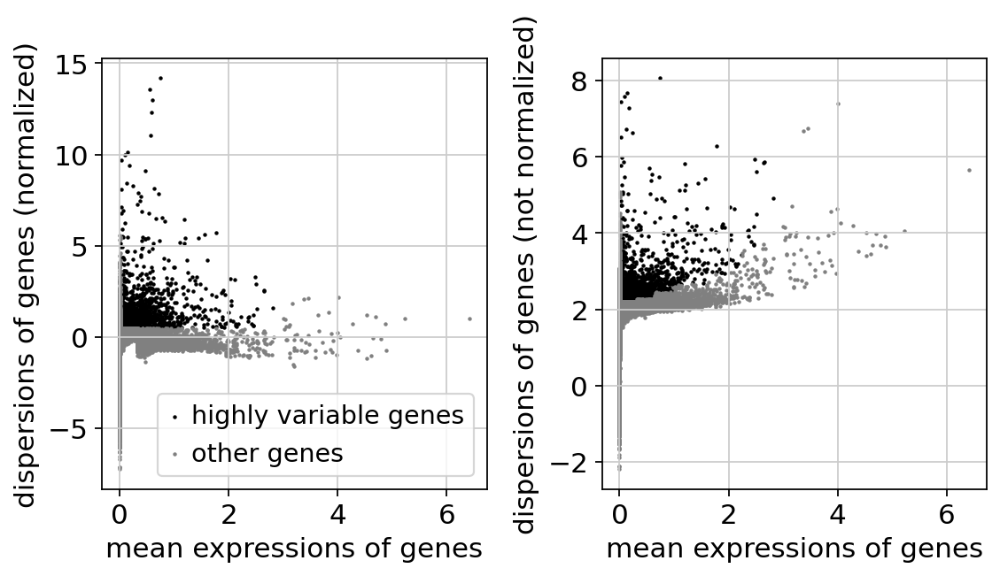

/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


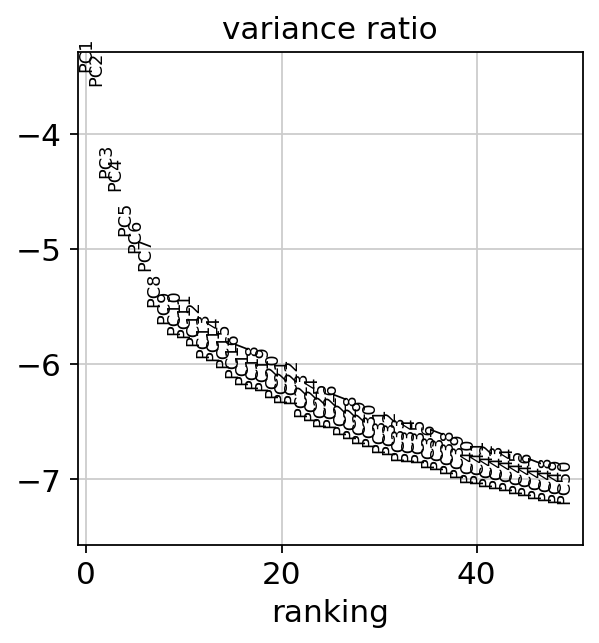

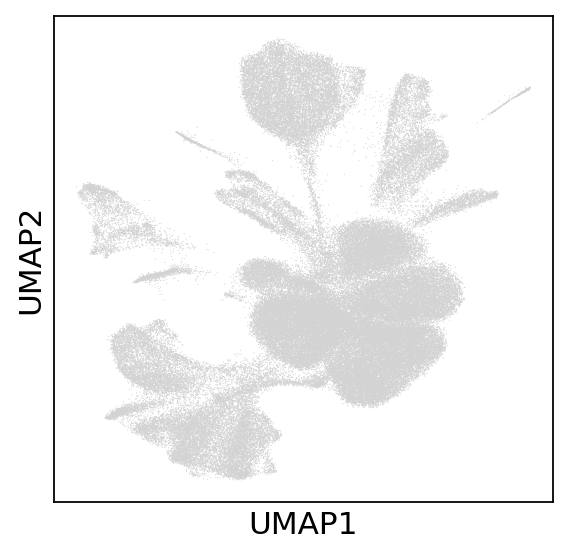

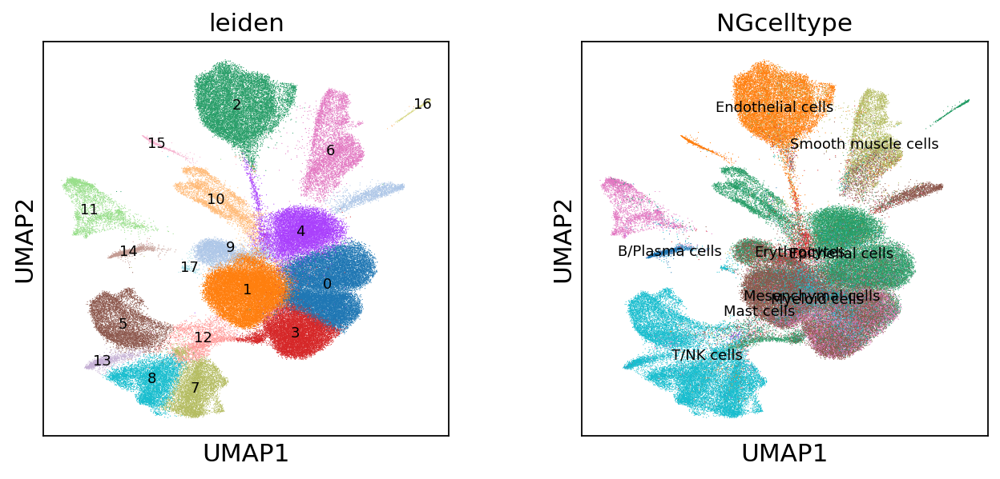

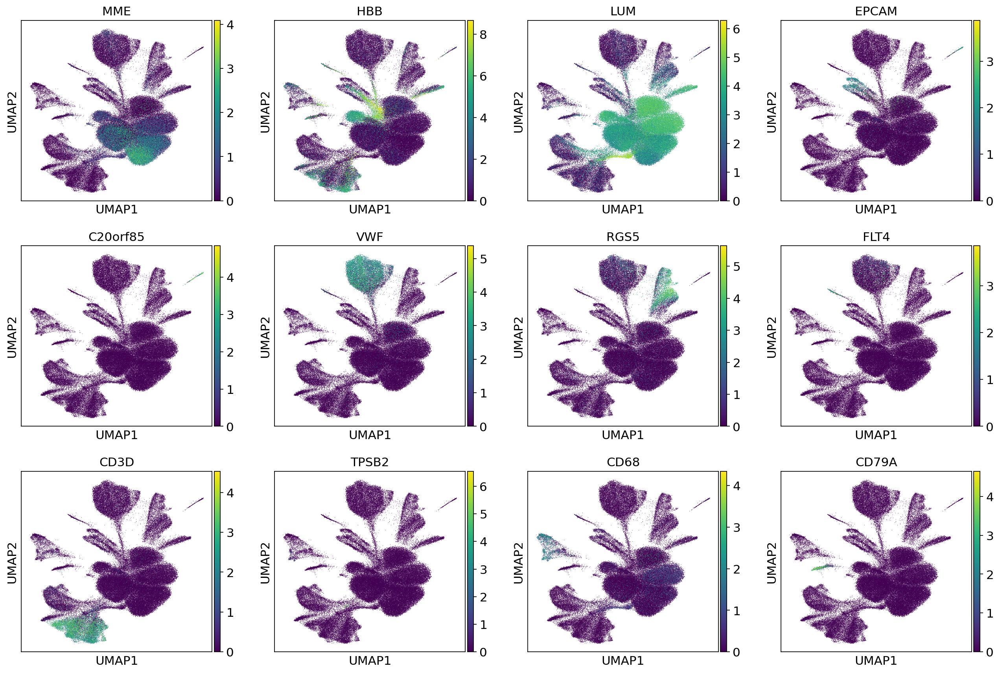

In [7]:
NGEU=NGdata[NGdata.obs["Major.Class"]=="Eutopic Endometrium",]
NGEU.uns['log1p']["base"] = None
sc.pp.highly_variable_genes(NGEU, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(NGEU)
NGEU.raw = NGEU

NGEU = NGEU[:, NGEU.var.highly_variable]
sc.pp.regress_out(NGEU, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(NGEU, max_value=10)
sc.tl.pca(NGEU, svd_solver='arpack')
sc.pl.pca_variance_ratio(NGEU, log=True,n_pcs=50)

bbknn.bbknn(NGEU,batch_key='sampleID')
sc.tl.umap(NGEU)
sc.pl.umap(NGEU)
sc.tl.leiden(NGEU)

sc.pl.umap(NGEU,color=['leiden',"NGcelltype"],legend_loc="on data",legend_fontsize='xx-small',legend_fontweight='medium')
sc.pl.umap(NGEU,color=['MME','HBB','LUM','EPCAM','C20orf85','VWF','RGS5','FLT4','CD3D','TPSB2','CD68','CD79A'])


/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


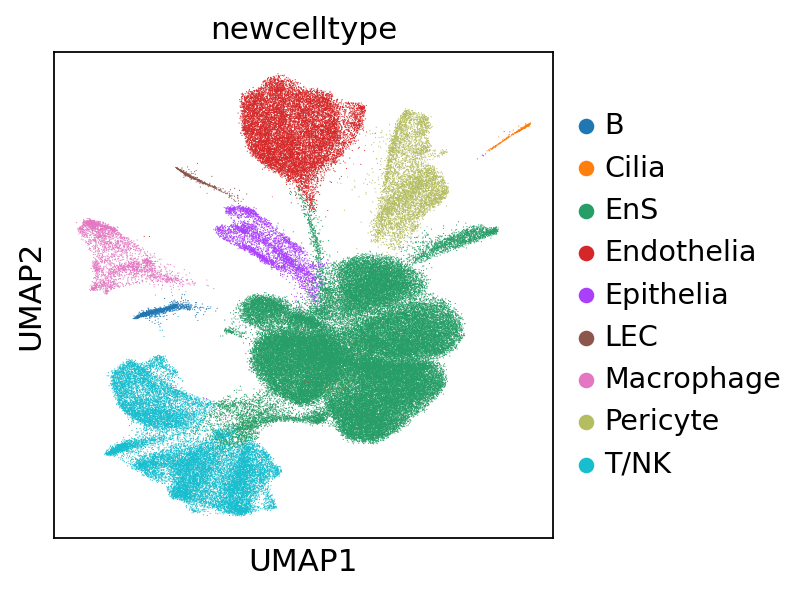

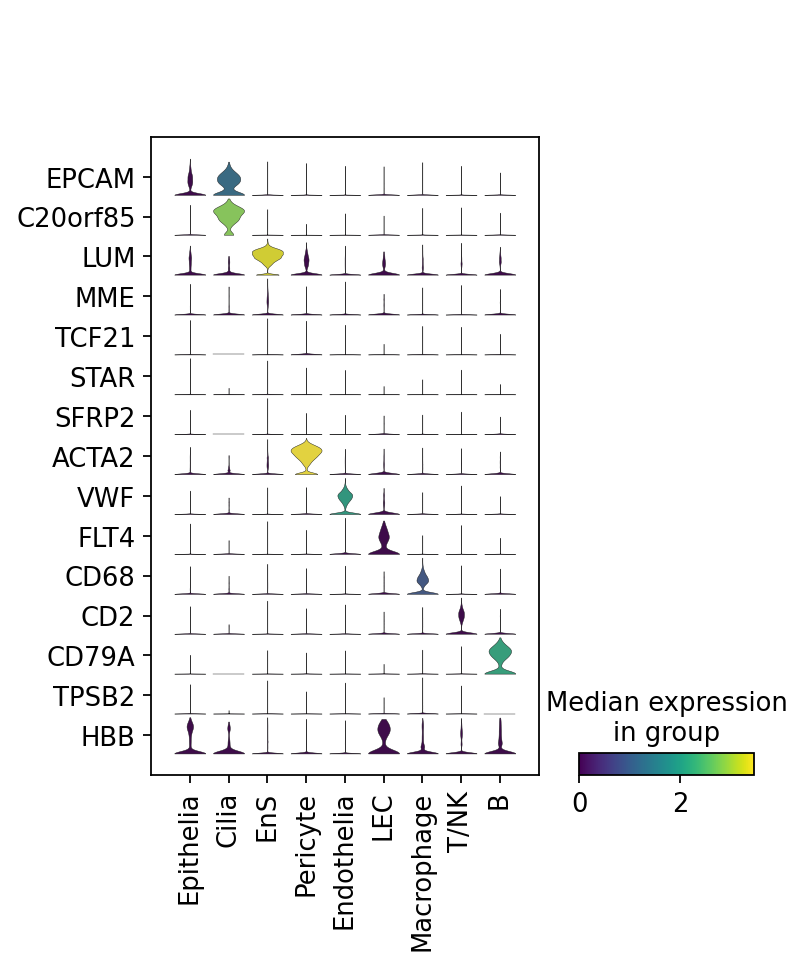

In [10]:
EUnew_cluster_names=['EnS0', 'EnS1','Endothelia2','EnS3','EnS4', 'T/NK5','Pericyte6','T/NK7','T/NK8','EnS9','Epithelia10','Macrophage11','EnS12','T/NK13','B14','LEC15','Cilia16','EnS17']
NGEU.obs['myname']=NGEU.obs['leiden']
NGEU.rename_categories('myname', EUnew_cluster_names)
NGEU.obs['newcelltype']=NGEU.obs.myname.str.strip('0123456789')
sc.pl.umap(NGEU, color=['newcelltype'],save="NGEU_newcelltype.pdf")
sc.pl.stacked_violin(NGEU,['EPCAM','C20orf85','LUM','MME','TCF21','STAR','SFRP2','ACTA2','VWF','FLT4','CD68','CD2','CD79A','TPSB2','HBB'],groupby="newcelltype",categories_order=['Epithelia','Cilia','EnS','Pericyte','Endothelia','LEC','Macrophage','T/NK','B'],cmap=None,save="NGEU_cellmarkes_stacked_violiln.pdf",swap_axes=True)
NGEU.write("NG_EU_umap_leiden_BBKNN.h5ad")

/home/liusong/.local/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


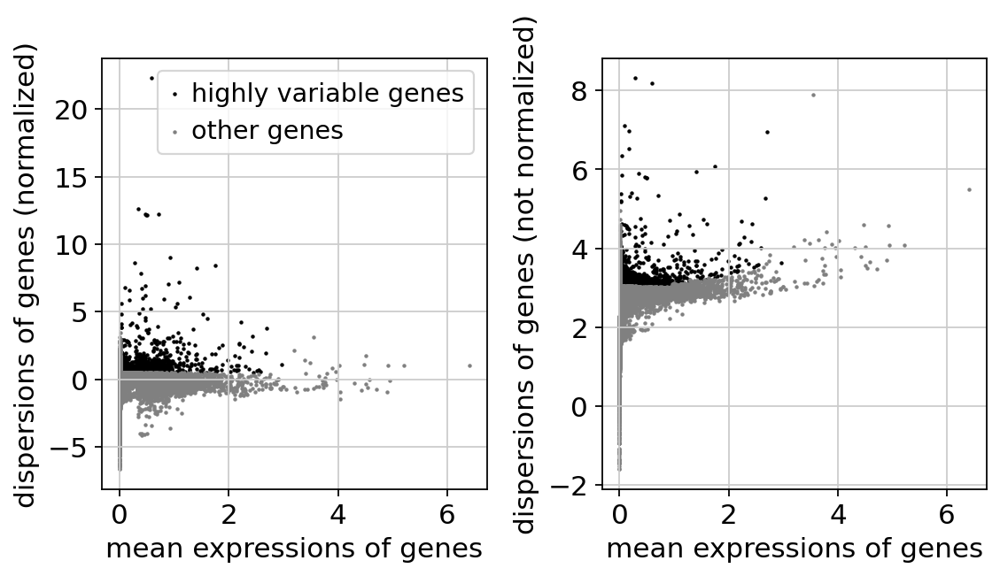

/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


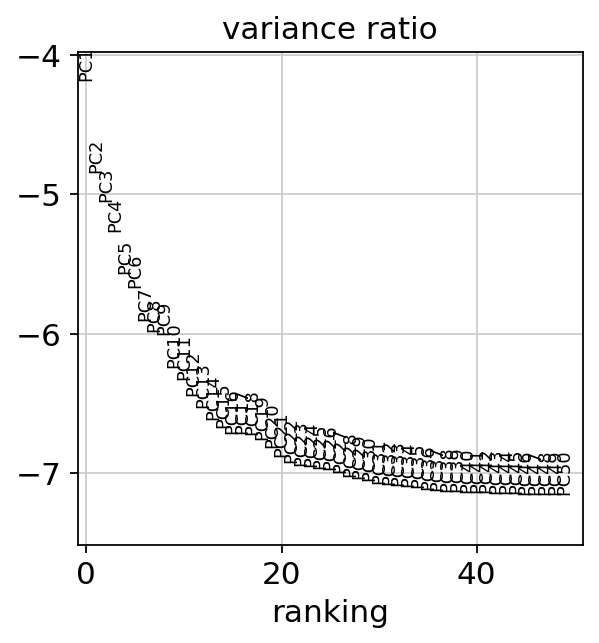

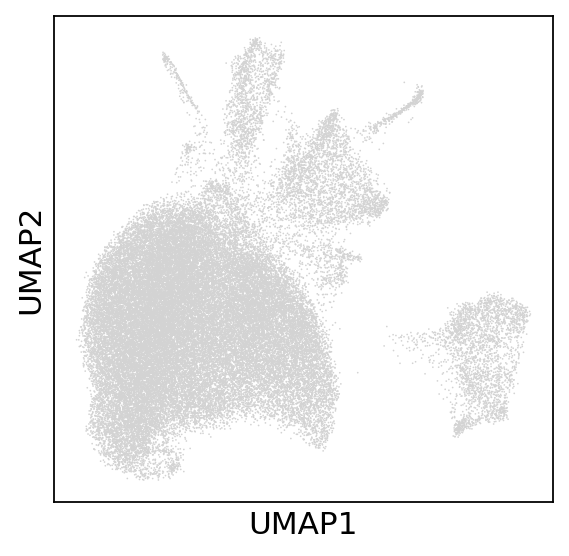

In [11]:
NGOV=NGdata[NGdata.obs["Major.Class"]=="Unaffected ovary",]
NGOV.uns['log1p']["base"] = None
sc.pp.highly_variable_genes(NGOV, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(NGOV)
NGOV.raw = NGOV

NGOV = NGOV[:, NGOV.var.highly_variable]
sc.pp.regress_out(NGOV, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(NGOV, max_value=10)
sc.tl.pca(NGOV, svd_solver='arpack')
sc.pl.pca_variance_ratio(NGOV, log=True,n_pcs=50)

bbknn.bbknn(NGOV,batch_key='sampleID')
sc.tl.umap(NGOV)
sc.pl.umap(NGOV)
sc.tl.leiden(NGOV)


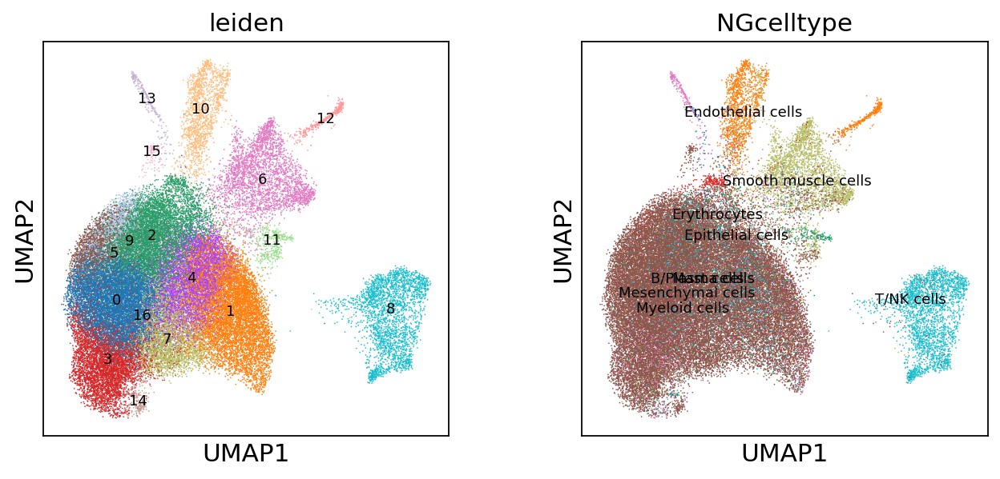

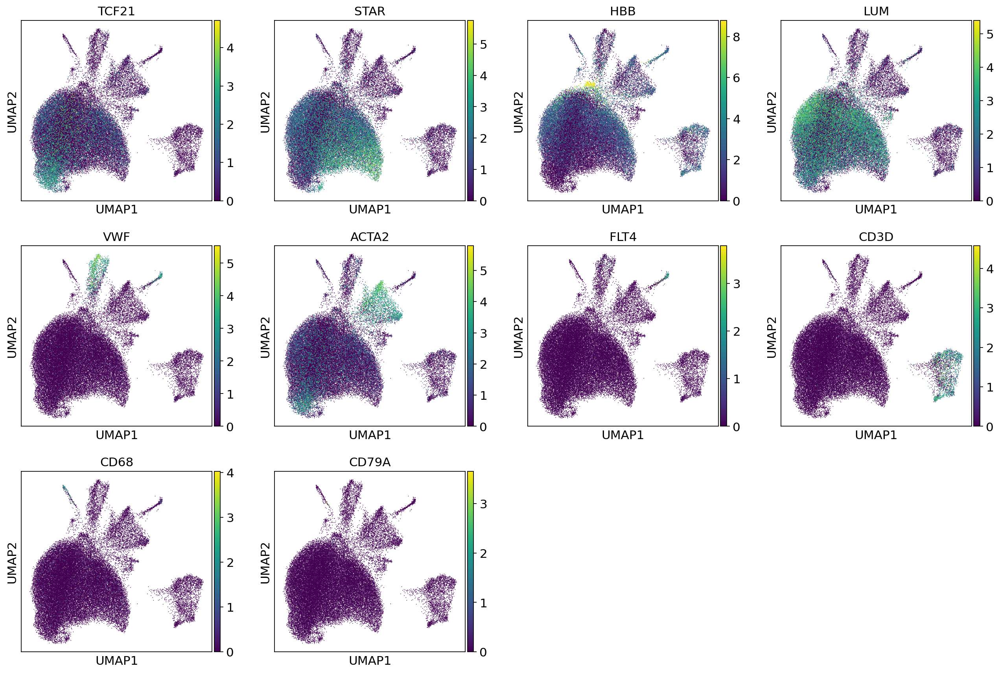

/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


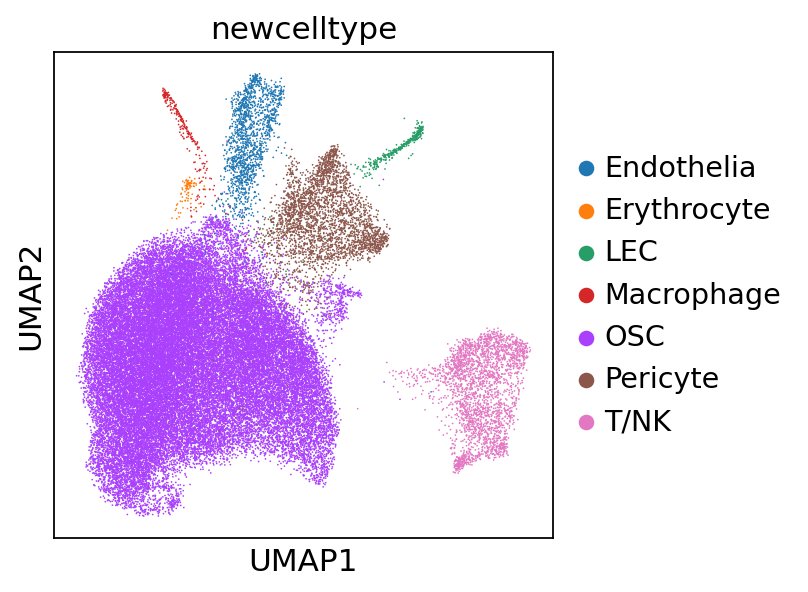

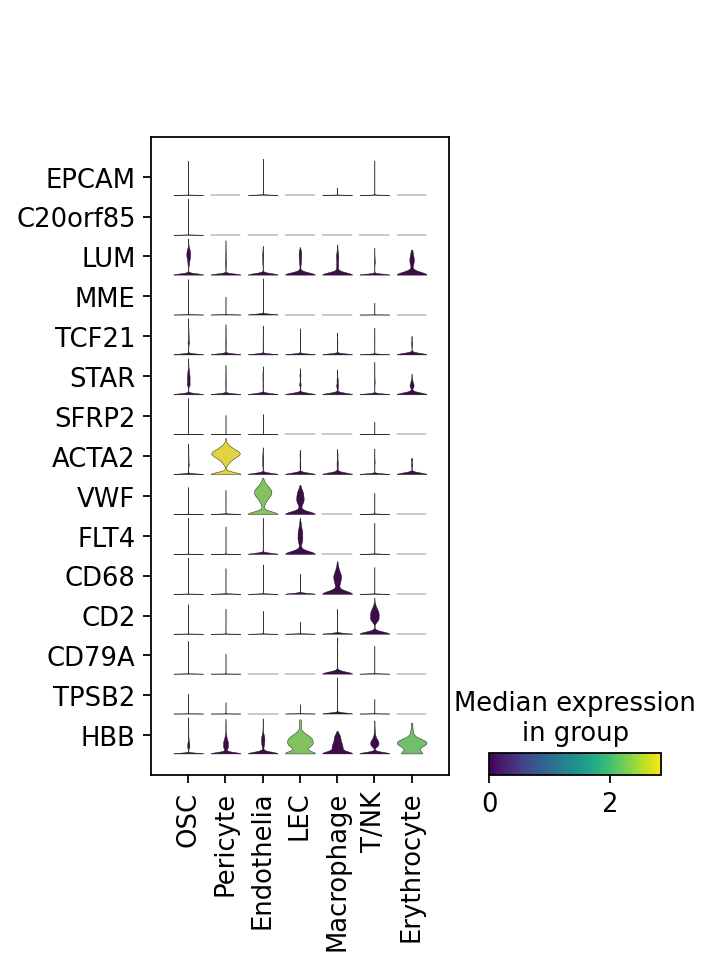

In [14]:
sc.pl.umap(NGOV,color=['leiden',"NGcelltype"],legend_loc="on data",legend_fontsize='xx-small',legend_fontweight='medium')
sc.pl.umap(NGOV,color=['TCF21','STAR','HBB','LUM','VWF','ACTA2','FLT4','CD3D','CD68','CD79A'])
OVnew_cluster_names=['OSC0', 'OSC1','OSC2','OSC3','OSC4','OSC5','Pericyte6','OSC7','T/NK8','OSC9','Endothelia10','OSC11','LEC12','Macrophage13','OSC14','Erythrocyte15','OSC16']
NGOV.obs['myname']=NGOV.obs['leiden']
NGOV.rename_categories('myname', OVnew_cluster_names)
NGOV.obs['newcelltype']=NGOV.obs.myname.str.strip('0123456789')
sc.pl.umap(NGOV, color=['newcelltype'],save="NGOV_newcelltype.pdf")
sc.pl.stacked_violin(NGOV,['EPCAM','C20orf85','LUM','MME','TCF21','STAR','SFRP2','ACTA2','VWF','FLT4','CD68','CD2','CD79A','TPSB2','HBB'],groupby="newcelltype",categories_order=['OSC','Pericyte','Endothelia','LEC','Macrophage','T/NK','Erythrocyte'],cmap=None,save="NGOV_cellmarkes_stacked_violiln.pdf",swap_axes=True)
NGOV.write("NG_OV_umap_leiden_BBKNN.h5ad")